In [48]:
import PIL
from PIL import Image
from tensorflow.keras import Model
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import numpy as np

In [49]:
original_image = '/content/IITKLibrary.jpg'
art_style = '/content/7589639.jpg'

In [50]:
original = cv2.resize(cv2.imread(original_image), (768, 768))
original = tf.image.convert_image_dtype(original, tf.float32)
art = cv2.resize(cv2.imread(art_style), (768, 768))
art = tf.image.convert_image_dtype(art, tf.float32)

In [51]:
def loss_object(style_outputs, content_outputs, style_target, content_target):
    cl = tf.reduce_mean((content_outputs - content_target)**2)
    sl = tf.add_n([tf.reduce_mean((output_ - target_)**2) for output_, target_ in zip(style_outputs, style_target)])
    return 0.00075 * cl + 0.7 * sl

In [52]:
def gram_matrix(ten):
    result = tf.linalg.einsum('bijc,bijd->bcd', ten, ten)
    i_times_j = tf.cast(tf.shape(ten)[1] * tf.shape(ten)[2], tf.float32)
    return tf.expand_dims(result, axis=0) / i_times_j

In [53]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
vgg.trainable = False
content_output = vgg.get_layer('block4_conv2').output
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
style_output = [vgg.get_layer(style_layer).output for style_layer in style_layers]
gram_style_output = [gram_matrix(output_) for output_ in style_output]
model = Model([vgg.input], [content_output, gram_style_output])
content_target = model(np.array([original * 255]))[0]
style_target = model(np.array([art * 255]))[1]

Current Epoch = 0, Training Loss = 792179900416.0


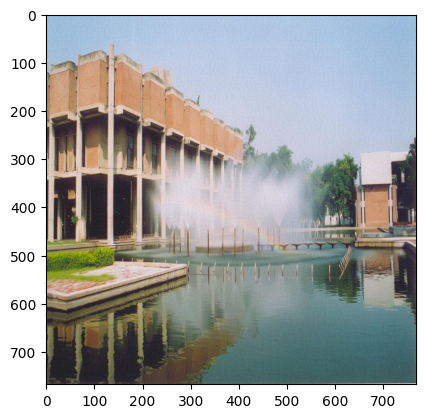

Current Epoch = 100, Training Loss = 21397192704.0


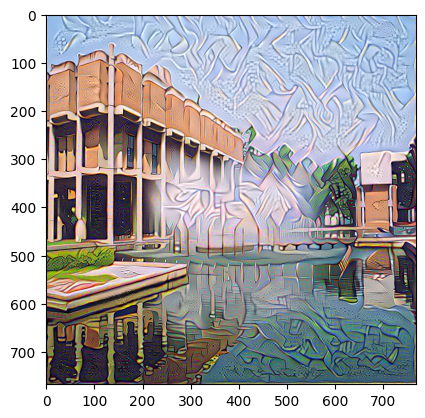

Current Epoch = 200, Training Loss = 9969825792.0


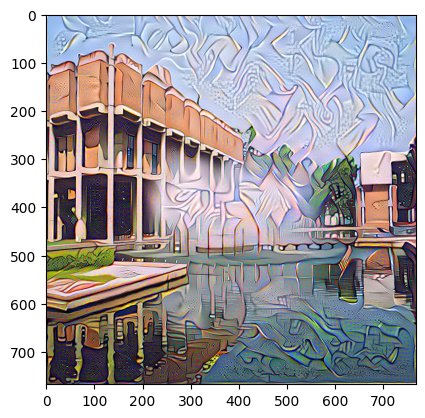

Current Epoch = 300, Training Loss = 6311828480.0


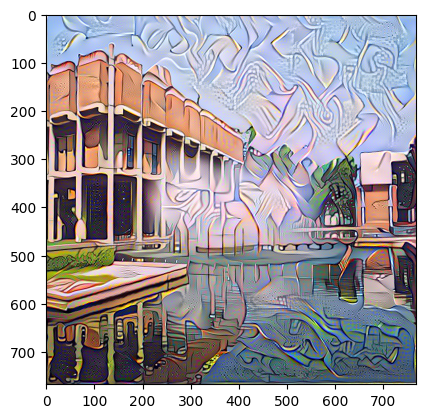

Current Epoch = 400, Training Loss = 4539389440.0


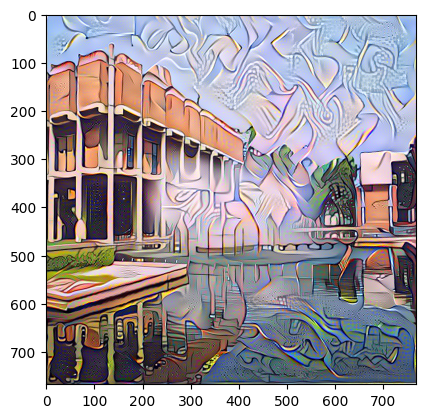

Current Epoch = 500, Training Loss = 3515814400.0


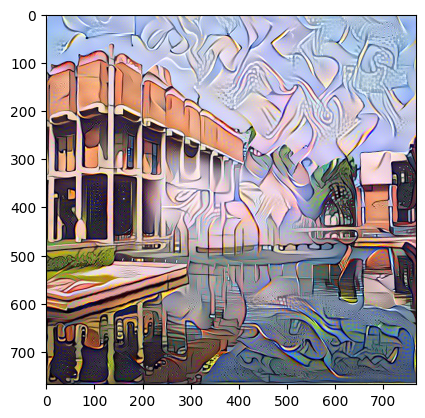

Current Epoch = 600, Training Loss = 2861468672.0


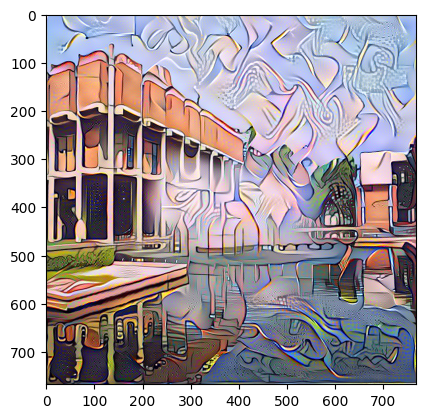

Current Epoch = 700, Training Loss = 2413633536.0


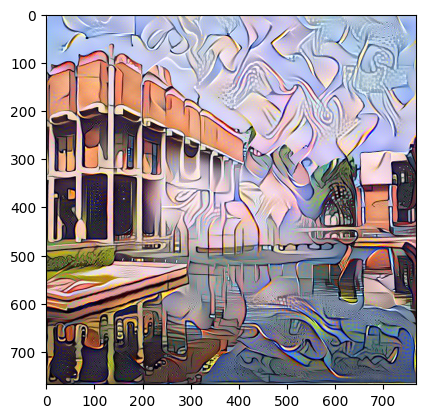

Current Epoch = 800, Training Loss = 2092520576.0


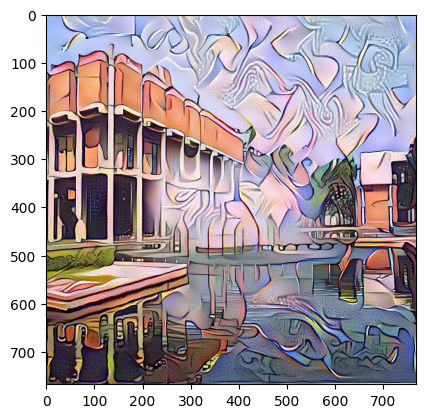

Current Epoch = 900, Training Loss = 1839545088.0


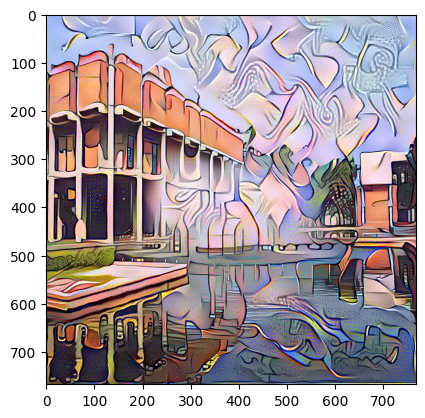

Current Epoch = 1000, Training Loss = 1635239552.0


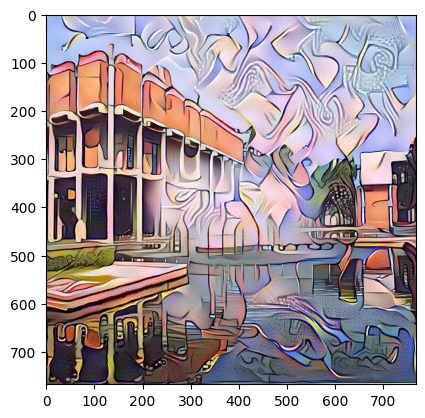

Current Epoch = 1100, Training Loss = 1463649792.0


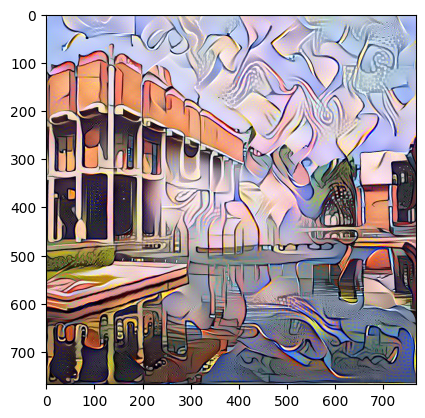

Current Epoch = 1200, Training Loss = 1319745920.0


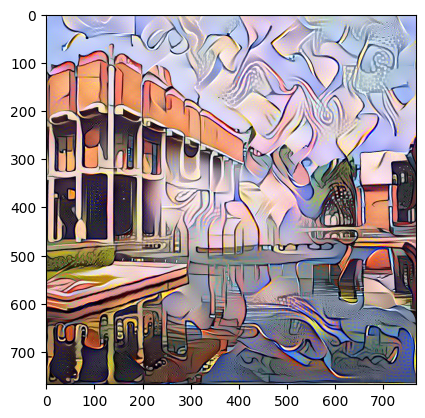

Current Epoch = 1300, Training Loss = 1200904448.0


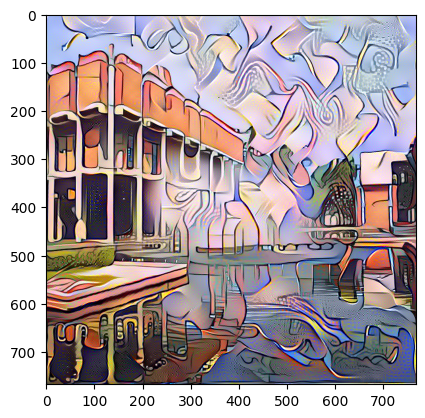

Current Epoch = 1400, Training Loss = 1100084992.0


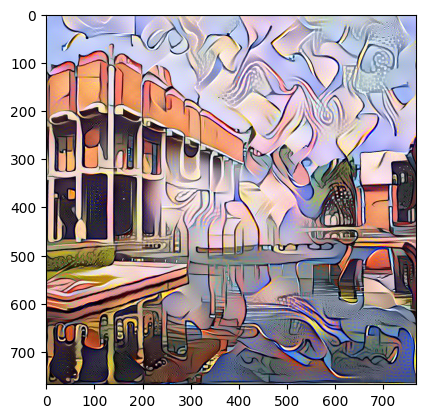

Current Epoch = 1500, Training Loss = 1011287680.0


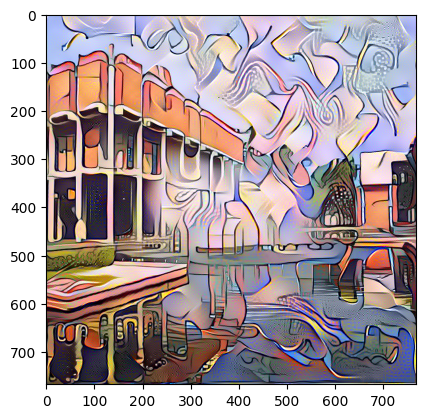

Current Epoch = 1600, Training Loss = 929743424.0


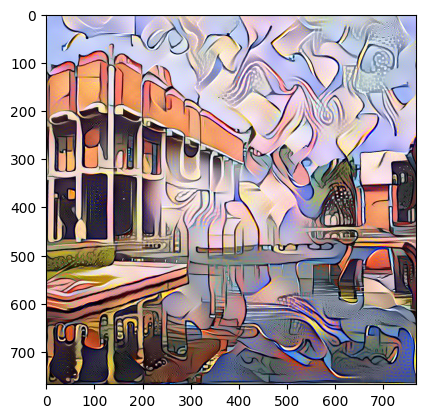

Current Epoch = 1700, Training Loss = 863926656.0


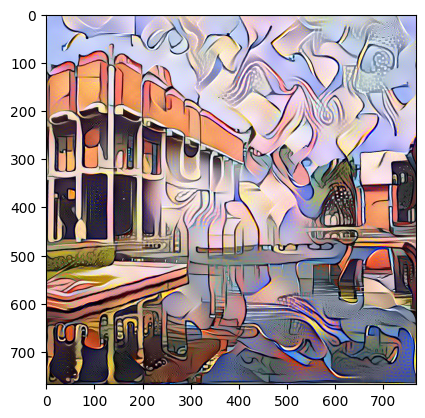

Current Epoch = 1800, Training Loss = 806979200.0


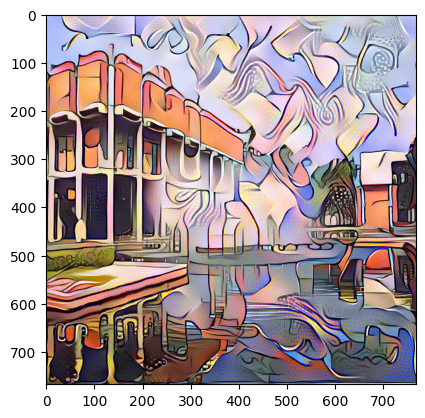

Current Epoch = 1900, Training Loss = 757544064.0


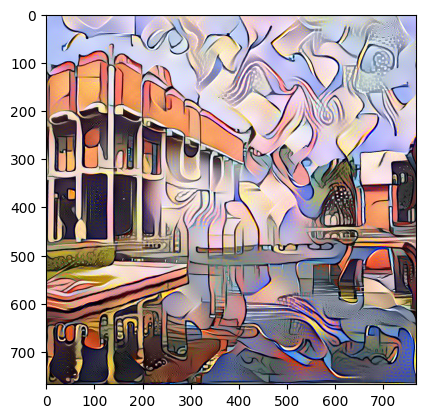

Current Epoch = 2000, Training Loss = 713162240.0


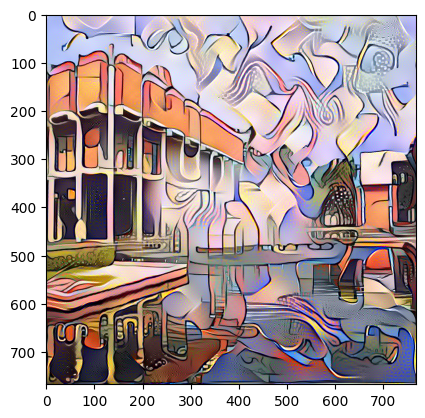

Current Epoch = 2100, Training Loss = 672453312.0


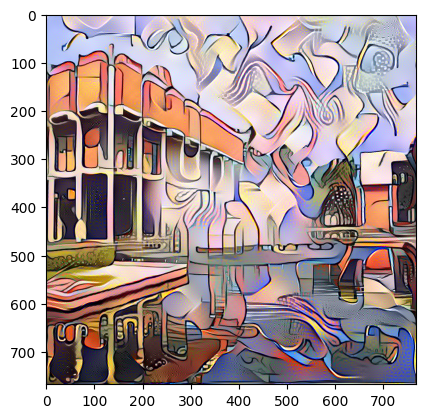

Current Epoch = 2200, Training Loss = 634950848.0


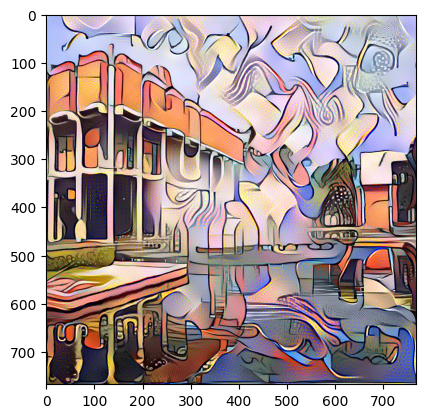

Current Epoch = 2300, Training Loss = 600867840.0


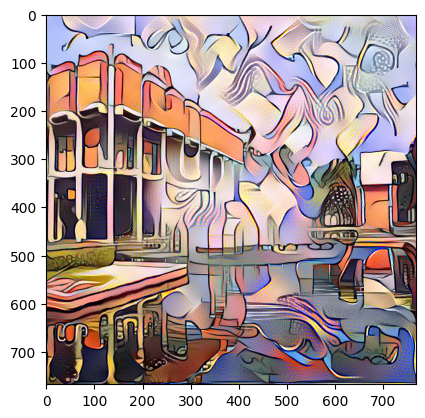

Current Epoch = 2400, Training Loss = 6656327680.0


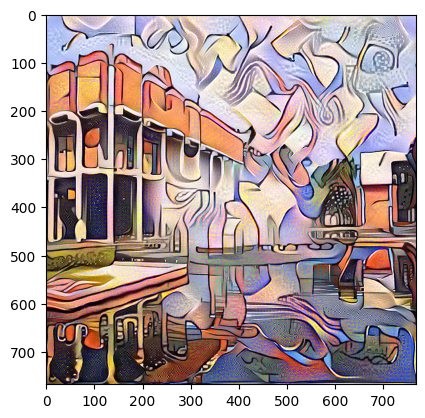

Current Epoch = 2500, Training Loss = 849180352.0


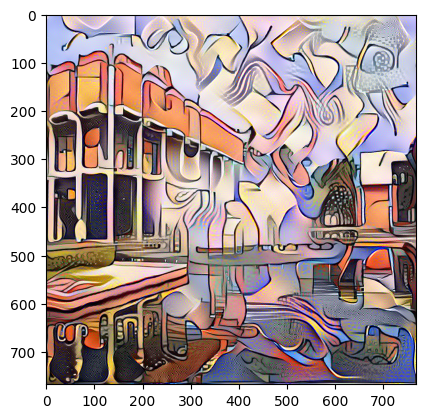

Current Epoch = 2600, Training Loss = 663306368.0


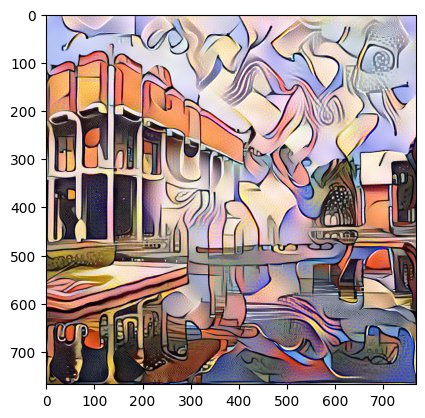

Current Epoch = 2700, Training Loss = 582845568.0


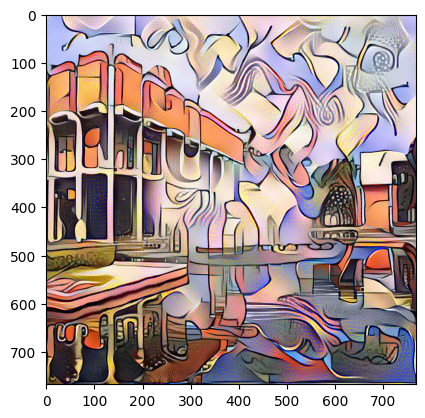

Current Epoch = 2800, Training Loss = 532643872.0


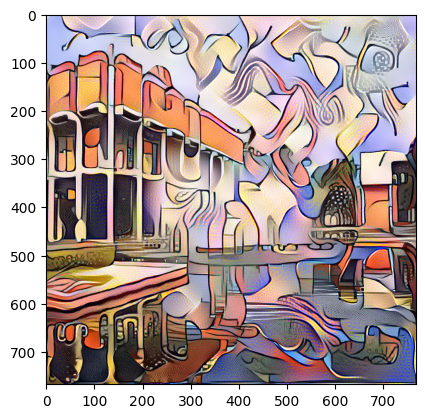

Current Epoch = 2900, Training Loss = 497563904.0


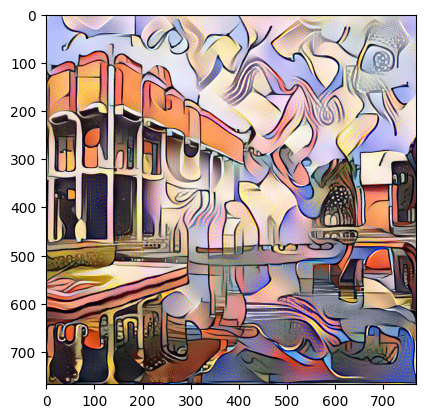

In [54]:
opt = tf.optimizers.Adam(learning_rate=0.01, beta_1=0.90, epsilon=0.1)
image = tf.image.convert_image_dtype(original, tf.float32)
image = tf.Variable([image])
for i in range(3000):
  with tf.GradientTape() as tape:
    output = model(image * 255)
    loss = loss_object(output[1], output[0], style_target, content_target)
    gradient = tape.gradient(loss, image)
    opt.apply_gradients([(gradient, image)])
    image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0))
    if i % 100 == 0:
        tf.print(f"Current Epoch = {i}, Training Loss = {loss}")
        tensor = image * 255
        tensor = np.array(tensor, dtype=np.uint8)
        if np.ndim(tensor) > 3:
            tensor = tensor[0]
        tensor = PIL.Image.fromarray(tensor)
        plt.imshow(cv2.cvtColor(np.array(tensor), cv2.COLOR_BGR2RGB))
        plt.show()

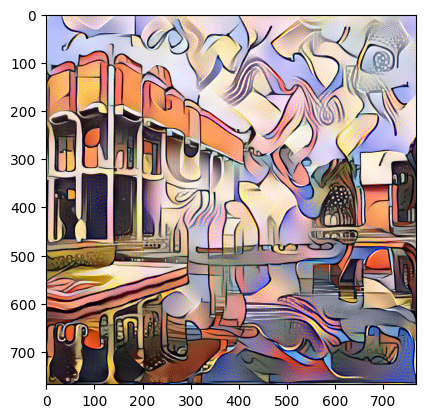

In [55]:
processed_tensor = image * 255
processed_tensor = np.array(processed_tensor, dtype=np.uint8)
if np.ndim(processed_tensor) > 3:
    processed_tensor = processed_tensor[0]
rgb_tensor = cv2.cvtColor(processed_tensor, cv2.COLOR_BGR2RGB)
pil_image = Image.fromarray(rgb_tensor)
pil_image.save('result.jpg')
plt.imshow(cv2.cvtColor(np.array(processed_tensor), cv2.COLOR_BGR2RGB))
plt.show()